# Find the area of interest

The goal is to find a set of two watersheds that:
* are on the same tributary
* one rural, one urban
* don't have a lot of missing values

In [1]:
import numpy as np 
import pandas as pd 
import os
from pandas_profiling  import ProfileReport

%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('./data/Water_FINAL.csv', index_col=0)

C:\Users\beren\anaconda3\envs\TensorFlow-GPU\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (2,3,4,5,6,9,11,13,15,17,21,22,23,24,27,28,31,32,33,34,35,36,37,40,41,42,43,44,45,46,47,48,49,50,55,56,57,58,59,60,61,62,63,64,65,66) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\beren\anaconda3\envs\TensorFlow-GPU\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [3]:
data.head()

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,Weather Conditions Yesterday,WindDirection,WindSpeed,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_
0,2143,NaN,NaN,NaN,NaN,NaN,CMC,04/28/2018,NaN,NaN,...,NaN,W,1-10 knots,MD,POINT (-75.93002800000002 39.480194),20600020206,Bohemia River,24015,Cecil County,MD
1,2145,NaN,NaN,NaN,NaN,NaN,CMC,04/28/2018,NaN,NaN,...,NaN,W,1-10 knots,MD,POINT (-75.902528 39.480444),20600020206,Bohemia River,24015,Cecil County,MD
2,2147,NaN,NaN,NaN,NaN,NaN,CMC,04/28/2018,NaN,NaN,...,NaN,S,1-10 knots,MD,POINT (-75.873639 39.466889),20600020206,Bohemia River,24015,Cecil County,MD
3,2151,NaN,NaN,NaN,NaN,NaN,CMC,04/28/2018,NaN,NaN,...,NaN,SW,1-10 knots,MD,POINT (-75.854444 39.454),20600020206,Bohemia River,24015,Cecil County,MD
4,2152,NaN,NaN,NaN,NaN,NaN,CMC,04/28/2018,NaN,NaN,...,NaN,SW,1-10 knots,MD,POINT (-75.84352800000001 39.463667),20600020206,Bohemia River,24015,Cecil County,MD


In [4]:
data.shape

(2708717, 72)

## General EDA

In [5]:
ProfileReport(data)

There are a lot of missing values (sparse data). Let's see if some watersheds stand out:

In [6]:
by_HUC_missing = data.groupby('HUC12').agg(lambda x: x.isnull().sum())
by_HUC_missing

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,Weather Conditions Yesterday,WindDirection,WindSpeed,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_
HUC12,,,,,,,,,,,,,,,,,,,,,
2.040303e+10,0,0,1503,0,1503,0,0,0,1503,1503.0,...,1503,244,126,1503,0,0,0,0,0,0
2.040303e+10,0,0,215,38,208,0,0,0,215,215.0,...,215,12,142,215,0,0,0,0,0,0
2.050101e+10,0,0,1390,1390,1345,0,0,0,161,1390.0,...,1390,1390,1390,1390,0,0,0,0,0,0
2.050101e+10,0,0,1416,1416,1361,0,0,0,168,1416.0,...,1416,1416,1416,1416,0,0,0,0,0,0
2.050102e+10,0,0,225,225,224,0,0,0,0,225.0,...,225,225,225,225,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2.080208e+10,0,0,12825,113,12283,0,0,0,12825,12825.0,...,12825,10951,10787,12825,0,0,0,0,0,0
2.080208e+10,0,0,8830,30,8183,0,0,0,8830,8830.0,...,8830,7709,7594,8830,0,0,0,0,0,0
2.080208e+10,0,0,33296,510,31735,0,0,0,33296,33296.0,...,33296,30627,30385,33296,0,0,0,0,0,0


Text(0, 0.5, 'Missing values')

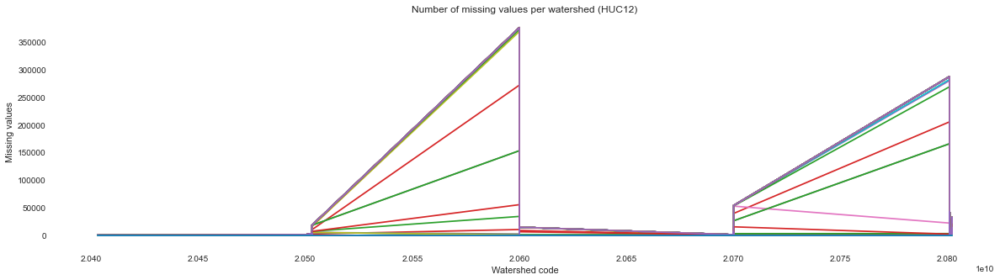

In [7]:
plt.figure(figsize=(20,5))
plt.plot(by_HUC_missing)
plt.title('Number of missing values per watershed (HUC12)')
plt.xlabel('Watershed code')
plt.ylabel('Missing values')

Text(0, 0.5, 'Missing values')

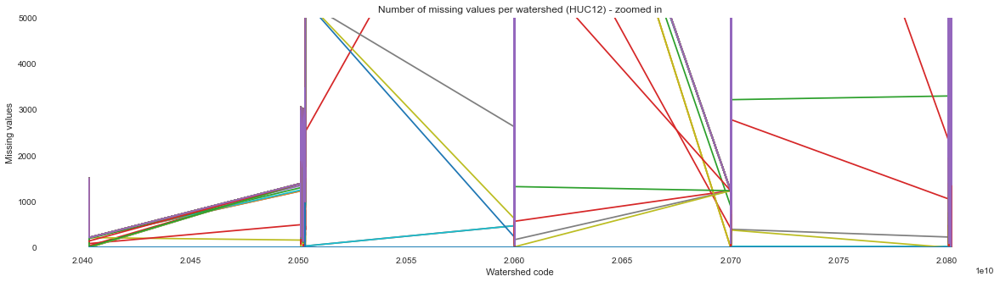

In [8]:
plt.figure(figsize=(20,5))
plt.plot(by_HUC_missing)
plt.ylim((-1, 5000))
plt.title('Number of missing values per watershed (HUC12) - zoomed in')
plt.xlabel('Watershed code')
plt.ylabel('Missing values')

Text(0, 0.5, 'Missing values')

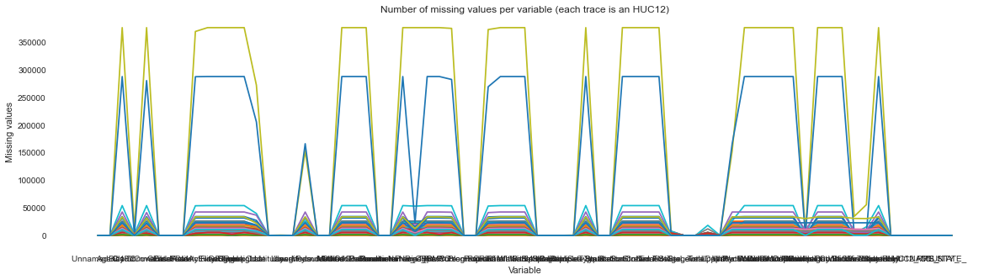

In [9]:
plt.figure(figsize=(20,5))
plt.plot(by_HUC_missing.transpose())
plt.title('Number of missing values per variable (each trace is an HUC12)')
plt.xlabel('Variable')
plt.ylabel('Missing values')

For a few watersheds, most of the variables have less than 200 missing values. That's encouraging. But maybe these locations don't have any data at all... 

In [10]:
def make_percent_missing(df, group_var = 'HUC12_'):
    count_missing = df.groupby(group_var).agg(lambda x: x.isnull().sum()).sum(axis=1)
    count_total = df.groupby(group_var).count().sum(axis =1) + count_missing
    percent_missing = count_missing/count_total
    return percent_missing

def plot_percent_missing(percent_missing):
    plt.figure(figsize=(20,5))
    plt.plot(percent_missing)
    plt.title('Percent of missing values per watershed')
    plt.xlabel('Watershed code')
    plt.ylabel('Percent Missing values')
    plt.xticks(rotation=45)
    plt.show()
    return

In [11]:
percent_missing = make_percent_missing(data)

In [12]:
percent_missing.describe()

count    759.000000
mean       0.588766
std        0.064239
min        0.476910
25%        0.527057
50%        0.574753
75%        0.661972
max        0.661972
dtype: float64

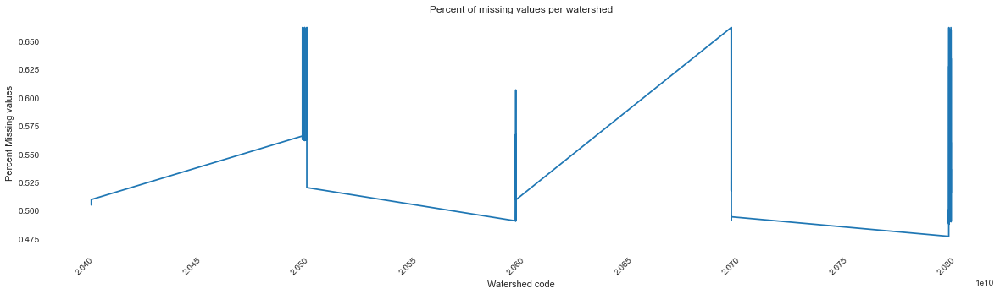

In [13]:
plot_percent_missing(percent_missing)

There is between 48 and 66% of missing values.

## Selecting two HUCs for modeling

We had decided to focus on 2017 and later data, and Virginia and Maryland, so we filter out the other states and apply the same approach. We also add HUC10 to the dataset to have more options. 

**ABOUT HUC12 CODES:** There should be a 0 as the first digit, so the codes are indeed 12 digits.

In [14]:
data.Date = pd.DatetimeIndex(data.Date)

In [15]:
data = data[pd.DatetimeIndex(data.Date).year > 2016]

In [16]:
data.head()

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,Weather Conditions Yesterday,WindDirection,WindSpeed,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_
0,2143,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,NaN,W,1-10 knots,MD,POINT (-75.93002800000002 39.480194),20600020206,Bohemia River,24015,Cecil County,MD
1,2145,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,NaN,W,1-10 knots,MD,POINT (-75.902528 39.480444),20600020206,Bohemia River,24015,Cecil County,MD
2,2147,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,NaN,S,1-10 knots,MD,POINT (-75.873639 39.466889),20600020206,Bohemia River,24015,Cecil County,MD
3,2151,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,NaN,SW,1-10 knots,MD,POINT (-75.854444 39.454),20600020206,Bohemia River,24015,Cecil County,MD
4,2152,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,NaN,SW,1-10 knots,MD,POINT (-75.84352800000001 39.463667),20600020206,Bohemia River,24015,Cecil County,MD


In [17]:
data["HUC10"] = data['HUC12_'].astype(str).apply(lambda x:x[0:9])
data.HUC10

0          206000202
1          206000202
2          206000202
3          206000202
4          206000202
             ...    
2708570    208020803
2708571    208020803
2708572    208020803
2708573    208020803
2708574    208020803
Name: HUC10, Length: 577214, dtype: object

In [18]:
# I added DC 
data_2s = data[(data.STATE_.values == 'VA') | (data.STATE_.values == 'MD') | (data.STATE_.values == 'DC')]
print('2 states number of observations:', data_2s.shape[0])
data_2s.head()

2 states number of observations: 515541


,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,WindDirection,WindSpeed,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_,HUC10
0,2143,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,W,1-10 knots,MD,POINT (-75.93002800000002 39.480194),20600020206,Bohemia River,24015,Cecil County,MD,206000202
1,2145,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,W,1-10 knots,MD,POINT (-75.902528 39.480444),20600020206,Bohemia River,24015,Cecil County,MD,206000202
2,2147,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,S,1-10 knots,MD,POINT (-75.873639 39.466889),20600020206,Bohemia River,24015,Cecil County,MD,206000202
3,2151,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,SW,1-10 knots,MD,POINT (-75.854444 39.454),20600020206,Bohemia River,24015,Cecil County,MD,206000202
4,2152,NaN,NaN,NaN,NaN,NaN,CMC,2018-04-28,NaN,NaN,...,SW,1-10 knots,MD,POINT (-75.84352800000001 39.463667),20600020206,Bohemia River,24015,Cecil County,MD,206000202


In [19]:
print('The 2 states post 2016 represent {}% of the data'.format(np.round(len(data_2s)/len(data)*100),2))

The 2 states post 2016 represent 89.0% of the data


In [20]:
unique, counts = np.unique(data_2s.HUC12_, return_counts=True)
len(unique)

361

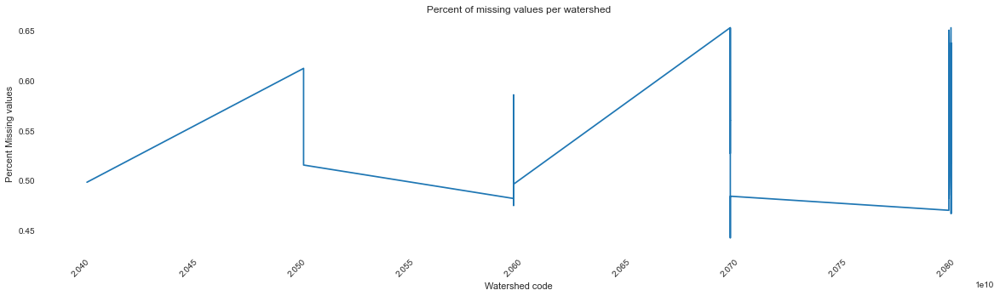

In [21]:
plot_percent_missing(make_percent_missing(data_2s))

We are looking at 360 HUC12 codes. The percentage of missing data is similar to the whole dataset's. Let's narrow down by HUC4, and focus on the Potomac river (HUC4 0207).

In [22]:
data["HUC4"] = data['HUC12_'].astype(str).apply(lambda x:x[0:3])
data.HUC4.unique()

array(['206', '208', '207', '205', '204'], dtype=object)

In [23]:
data_potom = data[data.HUC4 == '207']
print('The Potomac basin makes up {}% of the data'.format(np.round(len(data_potom)/len(data)*100),5))

The Potomac basin makes up 12.0% of the data


In [24]:
data_potom.STATE_.unique()

array(['DC', 'MD', 'VA', 'PA', 'WV'], dtype=object)

In [25]:
data_potom = data_potom[(data_potom.STATE_.values == 'VA') | (data_potom.STATE_.values == 'MD') | (data_potom.STATE_.values == 'DC')]
print('The Potomac basin in MD, DC and VA makes up {}% of the data'.format(np.round(len(data_potom)/len(data)*100),5))

The Potomac basin in MD, DC and VA makes up 11.0% of the data


We are down to 115 HUC12s or 53 HUC10s in 24 counties. If we group by HUC10 and count the missing values:

In [26]:
by_HUC_missing = data_potom.groupby('HUC10').agg(lambda x: x.isnull().sum())
by_HUC_missing

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,WindDirection,WindSpeed,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_,HUC4
HUC10,,,,,,,,,,,,,,,,,,,,,
207000201,0,12,12,12,12,12,0,0,12,12.0,...,12,12,0,0,0,0,0,0,0,0
207000202,0,0,1337,38,1337,0,0,0,1337,1337.0,...,1337,1337,1337,0,0,0,0,0,0,0
207000203,0,0,923,0,923,0,0,0,324,923.0,...,923,923,923,0,0,0,0,0,0,0
207000204,0,0,439,0,439,0,0,0,439,439.0,...,439,439,439,0,0,0,0,0,0,0
207000205,0,0,1337,10,1337,0,0,0,773,1337.0,...,1337,1337,1337,0,0,0,0,0,0,0
207000208,0,0,854,0,854,0,0,0,854,854.0,...,854,854,854,0,0,0,0,0,0,0
207000301,0,0,905,0,905,0,0,0,324,905.0,...,905,905,905,0,0,0,0,0,0,0
207000304,0,7,603,7,603,7,0,0,7,603.0,...,603,603,596,0,0,0,0,0,0,0
207000308,0,0,434,0,434,0,0,0,434,434.0,...,434,434,434,0,0,0,0,0,0,0


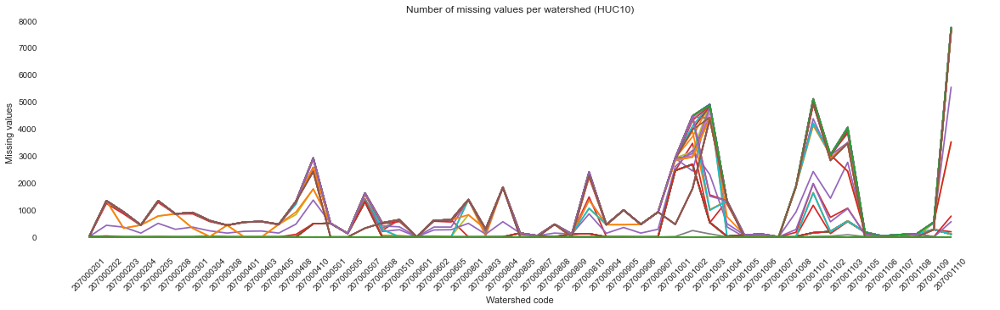

In [27]:
plt.figure(figsize=(20,5))
plt.plot(by_HUC_missing)
plt.title('Number of missing values per watershed (HUC10)')
plt.xlabel('Watershed code')
plt.ylabel('Missing values')
plt.xticks(rotation=45)
plt.show()

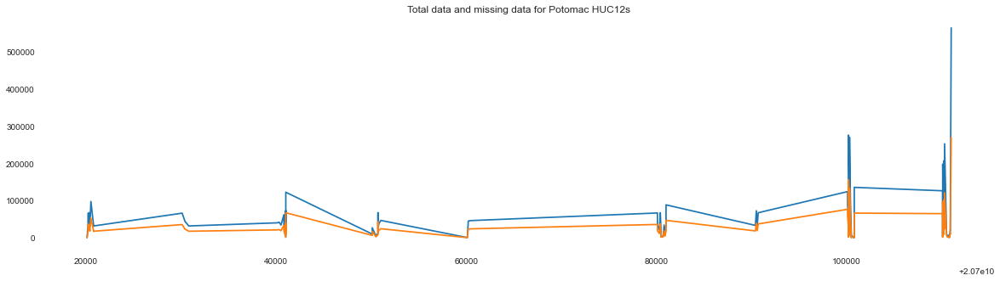

In [28]:
count_missing = data_potom.groupby('HUC12_').agg(lambda x: x.isnull().sum()).sum(axis=1)
count_total = data_potom.groupby('HUC12_').count().sum(axis =1) + count_missing
plt.figure(figsize = (20,5))
plt.plot(count_total)
plt.plot(count_missing)
plt.title('Total data and missing data for Potomac HUC12s')
plt.show()

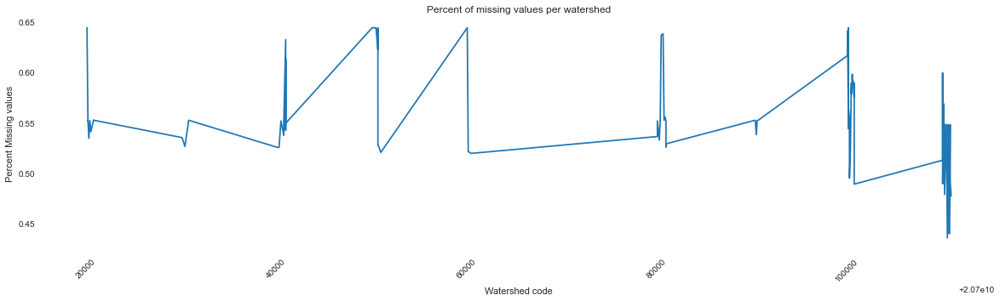

In [29]:
plot_percent_missing(make_percent_missing(data_potom))


There tends to be a higher proportion of missing data where there is less data altogether. However, some HUC12 areas might have less collection stations, making it hard to compare the absolute amount of data. Let's look at the distribution of data on the river.

In [30]:
county_keys = data_potom.COUNTY_.unique()
county_keys

array(['District of Columbia', 'Charles County', "St. Mary's County",
       'Washington County', 'Prince William County', 'Fauquier County',
       "Prince George's County", 'Montgomery County', 'Fairfax County',
       'Alexandria city', 'King George County', 'Westmoreland County',
       'Stafford County', 'Northumberland County', 'Augusta County',
       'Allegany County', 'Garrett County', 'Rockingham County',
       'Waynesboro city', 'Warren County', 'Shenandoah County',
       'Frederick County', 'Loudoun County', 'Carroll County',
       'Arlington County'], dtype=object)

In [31]:
# Manually assign a level on the potomac river for these counties
# I defined 3 levels (in order, upstream to downstream): 
# Upstream, DC metro, Downstream
# source http://insulators24.org/territorial.aspx
# Counties in the Shenandoah valley are considered upstream (the river is a tributary of the Potomac 
# river upstream from DC, see https://en.wikipedia.org/wiki/Shenandoah_Valley)
county_values = ['DC metro', 'Downstream', 'Downstream', 
                'Upstream', 'Downstream', 'Upstream',
                'DC metro', 'Upstream', 'DC metro',
                'DC metro', 'Downstream', 'Downstream',
                'Downstream', 'Downstream', 'Upstream', 
                'Upstream', 'Upstream', 'Upstream', 
                'Upstream', 'Upstream', 'Upstream', 
                'Upstream', 'Upstream', 'Upstream', 
                 'DC metro']
counties_level = dict(zip(county_keys, county_values)) 


In [32]:
data_potom['Stream_level'] = data_potom['COUNTY_'].map(counties_level)

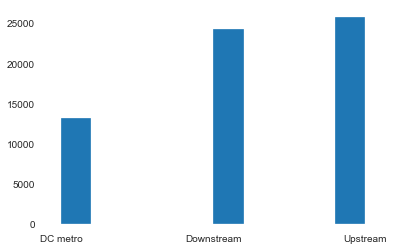

In [33]:
plt.hist(data_potom.Stream_level)
plt.show()

In [34]:
data_potom.groupby('Stream_level').HUC12_.count()

Stream_level
DC metro      13264
Downstream    24356
Upstream      25795
Name: HUC12_, dtype: int64

We have about the same amount data and HUC12s for the counties upstream and downstream from DC.

Now let's pick one county for each stream level that has lesser sparse data.

In [35]:
upstream_huc = make_percent_missing(data_potom[data_potom.Stream_level == 'Upstream'])

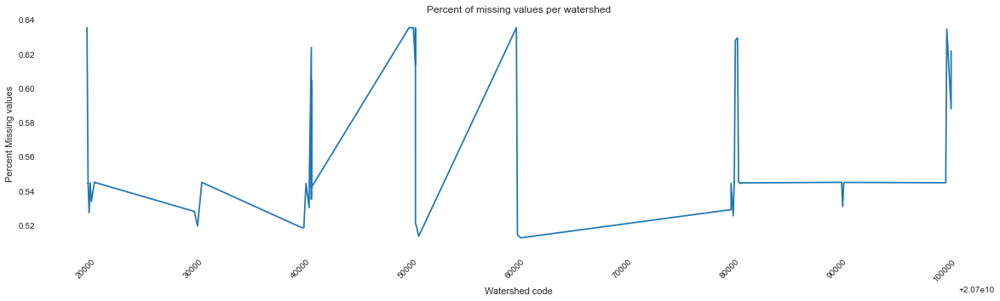

In [36]:
plot_percent_missing(upstream_huc)

In [37]:
upstream_huc.describe()

count    54.000000
mean      0.567262
std       0.046012
min       0.512444
25%       0.531448
50%       0.544590
75%       0.626222
max       0.635135
dtype: float64

In [38]:
best_10_upstream =  list(upstream_huc.sort_values().head(10).index)

In [39]:
df_best_upstream = data_potom[data_potom['HUC12_'].isin(best_10_upstream)]
df_best_upstream

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_,HUC10,HUC4,Stream_level
41006,5,NaN,NaN,NaN,NaN,NaN,CMC,2017-01-01,NaN,NaN,...,MD,POINT (-78.341849 39.673961),20700030405,Bear Creek-Sideling Hill Creek,24001,Allegany County,MD,207000304,207,Upstream
62685,5,NaN,NaN,NaN,NaN,NaN,CMC,2017-01-01,NaN,NaN,...,MD,POINT (-78.341849 39.673961),20700030405,Bear Creek-Sideling Hill Creek,24001,Allegany County,MD,207000304,207,Upstream
70970,5,NaN,NaN,NaN,NaN,NaN,CMC,2017-01-01,NaN,NaN,...,MD,POINT (-78.341849 39.673961),20700030405,Bear Creek-Sideling Hill Creek,24001,Allegany County,MD,207000304,207,Upstream
111494,5,NaN,NaN,NaN,NaN,NaN,CMC,2017-01-01,NaN,NaN,...,MD,POINT (-78.341849 39.673961),20700030405,Bear Creek-Sideling Hill Creek,24001,Allegany County,MD,207000304,207,Upstream
192338,5,NaN,NaN,NaN,NaN,NaN,CMC,2017-01-01,NaN,NaN,...,MD,POINT (-78.341849 39.673961),20700030405,Bear Creek-Sideling Hill Creek,24001,Allegany County,MD,207000304,207,Upstream
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2354093,4188273,VADEQ,NaN,NaN,NaN,NTN018,CBP,2018-03-08,NaN,NaN,...,NaN,POINT (-77.57616 39.25458),20700080302,Catoctin Creek,51107,Loudoun County,VA,207000803,207,Upstream
2354094,4188274,VADEQ,NaN,NaN,NaN,NTN018,CBP,2018-03-08,NaN,NaN,...,NaN,POINT (-77.57616 39.25458),20700080302,Catoctin Creek,51107,Loudoun County,VA,207000803,207,Upstream
2354095,4188275,VADEQ,NaN,NaN,NaN,NTN018,CBP,2018-03-08,NaN,NaN,...,NaN,POINT (-77.57616 39.25458),20700080302,Catoctin Creek,51107,Loudoun County,VA,207000803,207,Upstream
2354096,4188276,VADEQ,NaN,NaN,NaN,NTN018,CBP,2018-03-08,NaN,NaN,...,NaN,POINT (-77.57616 39.25458),20700080302,Catoctin Creek,51107,Loudoun County,VA,207000803,207,Upstream


In [40]:
df_best_upstream.groupby('HUC12_').Date.count()

HUC12_
20700020302    923
20700030405    603
20700040102    549
20700040305    572
20700050704    324
20700050801    519
20700051004    638
20700060204    615
20700060503    632
20700080302    289
Name: Date, dtype: int64

020700020302 has data at different dates, it's the Lower Georges Creek HUC (amongst the furthest upstream)

020700030405    is Bear Creek-Sideling Hill Creek

020700040102    is Barnetts Run-Tonoloway Creek

All in North West MD

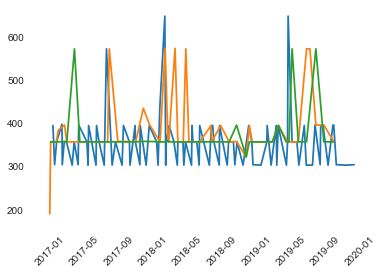

In [41]:
plt.plot(data_potom[data_potom.HUC12_ == 20700020302].groupby('Date').count().sum(axis =1))
plt.plot(data_potom[data_potom.HUC12_ == 20700030405].groupby('Date').count().sum(axis =1))
plt.plot(data_potom[data_potom.HUC12_ == 20700040102].groupby('Date').count().sum(axis =1))

plt.xticks(rotation = 45)
plt.show()

All three seem to have a similar and evenly spread amount of data. They are all good candidates.

Note: they belong to the same HUC6, but that is the highest comon division

In [42]:
downstream_huc = make_percent_missing(data_potom[data_potom.Stream_level == 'Downstream'])

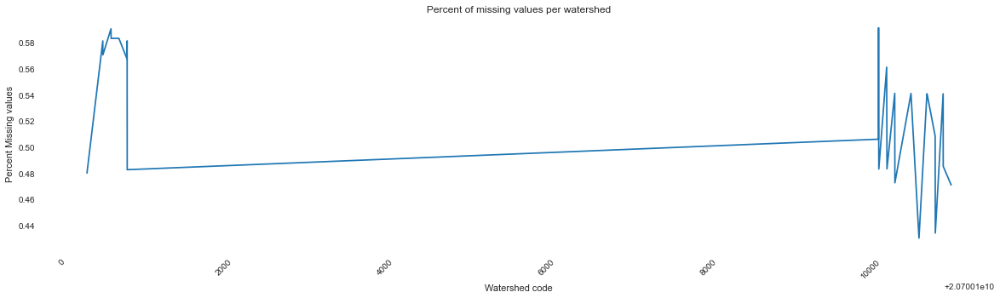

In [43]:
plot_percent_missing(downstream_huc)

In [44]:
downstream_huc.describe()

count    26.000000
mean      0.525563
std       0.049289
min       0.430007
25%       0.482999
50%       0.540541
75%       0.569654
max       0.591120
dtype: float64

In [45]:
best_10_downstream =  list(downstream_huc.sort_values().head(10).index)

In [46]:
df_best_downstream = data_potom[data_potom['HUC12_'].isin(best_10_downstream)]
df_best_downstream

,Unnamed: 0.1,Agency,BiasPC,CloudCover,Comments,Cruise,Database,Date,FieldActivityEventType,FieldActivityRemark,...,state,Point,HUC12_,HUCNAME_,FIPS_,COUNTY_,STATE_,HUC10,HUC4,Stream_level
4448,2104,NaN,NaN,NaN,7.9m CAW RMS,NaN,CMC,2019-04-25,NaN,NaN,...,MD,POINT (-76.851 38.23575),20700111001,Outlet Potomac River,24017,Charles County,MD,207001110,207,Downstream
4449,2105,NaN,NaN,NaN,7.9m CAW RMS,NaN,CMC,2019-04-25,NaN,NaN,...,MD,POINT (-76.851 38.23575),20700111001,Outlet Potomac River,24017,Charles County,MD,207001110,207,Downstream
4450,2106,NaN,NaN,NaN,7.9m CAW RMS,NaN,CMC,2019-04-25,NaN,NaN,...,MD,POINT (-76.851 38.23575),20700111001,Outlet Potomac River,24017,Charles County,MD,207001110,207,Downstream
4451,2107,NaN,NaN,NaN,7.9m CAW RMS,NaN,CMC,2019-04-25,NaN,NaN,...,MD,POINT (-76.851 38.23575),20700111001,Outlet Potomac River,24017,Charles County,MD,207001110,207,Downstream
4452,2108,NaN,NaN,NaN,7.9m CAW RMS,NaN,CMC,2019-04-25,NaN,NaN,...,MD,POINT (-76.851 38.23575),20700111001,Outlet Potomac River,24017,Charles County,MD,207001110,207,Downstream
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2408439,4302790,MDDNR,NaN,Clear (0-10%),NaN,BAY749,CBP,2019-07-22,NaN,NaN,...,NaN,POINT (-76.3477 38.0215),20700111001,Outlet Potomac River,24037,St. Mary's County,MD,207001110,207,Downstream
2408440,4302791,MDDNR,NaN,Clear (0-10%),NaN,BAY749,CBP,2019-07-22,NaN,NaN,...,NaN,POINT (-76.3477 38.0215),20700111001,Outlet Potomac River,24037,St. Mary's County,MD,207001110,207,Downstream
2408441,4302792,MDDNR,NaN,Clear (0-10%),NaN,BAY749,CBP,2019-07-22,NaN,NaN,...,NaN,POINT (-76.3477 38.0215),20700111001,Outlet Potomac River,24037,St. Mary's County,MD,207001110,207,Downstream
2408442,4302793,MDDNR,NaN,Clear (0-10%),NaN,BAY749,CBP,2019-07-22,NaN,NaN,...,NaN,POINT (-76.3477 38.0215),20700111001,Outlet Potomac River,24037,St. Mary's County,MD,207001110,207,Downstream


In [47]:
df_best_downstream.Stream_level.unique()

array(['Downstream', 'DC metro'], dtype=object)

In [48]:
df_best_downstream.groupby('HUC12_').Date.count()

HUC12_
20700100307    3696
20700100805    1856
20700110102    1730
20700110106    2709
20700110207    2830
20700110305    3461
20700110603      39
20700110805       9
20700110903     275
20700111001    7732
Name: Date, dtype: int64

020700100307  has the most data at different dates, it's the Little Hunting Creek-Potomac River HUC12. It's right after DC metro, still partially on metro counties.

020700100805 is Occoquan Bay-Potomac River HUC12, on the VA side about 15 miles downstream from DC.

020700040102 is Marbury Run-Mattawoman Creek HUC12, on the Maryland side, flowing the Potomac river about 15-20 miles downstream from DC.

020700110106 is Tank Creek-Potomac River HUC12, on the Virginia side even further downstream. Since Tank Creek is very small, we have higher chances of this HUC12 being samples of the Potomac river rather than the creek.

We would have to check lat-log to establish if the collection stations are actually on the Potomac river or on the tributaries.

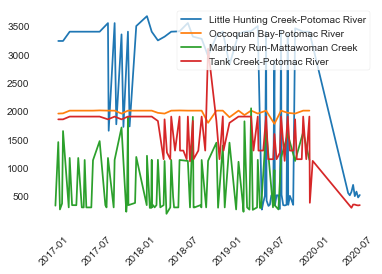

In [49]:
plt.plot(data_potom[data_potom.HUC12_ == 20700100307].groupby('Date').count().sum(axis =1))
plt.plot(data_potom[data_potom.HUC12_ == 20700100805].groupby('Date').count().sum(axis =1))
plt.plot(data_potom[data_potom.HUC12_ == 20700110102].groupby('Date').count().sum(axis =1))
plt.plot(data_potom[data_potom.HUC12_ == 20700110106].groupby('Date').count().sum(axis =1))

plt.legend(('Little Hunting Creek-Potomac River', 'Occoquan Bay-Potomac River', 'Marbury Run-Mattawoman Creek', 'Tank Creek-Potomac River'))
plt.xticks(rotation = 45)
plt.show()

Occoquan Bay-Potomac River has a more consistent amount of data over time. 

Little Hunting Creek-Potomac River has a lot more but also periods of time with little data.

All 4 have more data than the upstream HUC, even at the lower collection dates. They are reasonable candidates, and we need to decide if we want to be in the metro still or more downstream. Mapping the latitude and longitude of the collection stations might be relevant at this point.

Note: they belong to the same HUC6, and are in the same HUC8 two by two. 'Marbury Run-Mattawoman Creek' and 'Tank Creek-Potomac River' are even in the same HUC10.